# Pick a case from the 5 years of lakes, and do an analysis 

<a id='Outline'></a>

[Clean 7-day equator case](#cleancase)

[GFS lead time ensemble](#GFS)

### Package imports

In [1]:
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np

import os         
from glob import glob
import xarray as xr

from shapely import geometry
import pandas as pd
import geopandas as gp

from datetime import datetime,timedelta

In [2]:
# A quicklook display routine for a case, based on its filename in GEOJSONS
# like '2014_05_15_02_lat9p247N.geojson'

def showme(filename):   # like '2014_05_15_02_lat9p247N.geojson'
    gdf = gp.read_file('GEOJSONS/' + filename)
    fig, ax = plt.subplots()
    ax.set_aspect('equal')
    ax.set_xlim(30, 93)
    ax.set_ylim(-30,30)
    ax.set_title(filename)

    gdf.drop_duplicates().plot(ax=ax, column='time', facecolor='none', alpha=1, cmap='jet') #, legend=True)
    #plt.colorbar()
    #gdf.boundary.plot(ax=ax, color='black')
    
    path = gp.datasets.get_path('naturalearth_lowres')
    mapdf = gp.read_file(path)
    mapdf.boundary.plot(ax=ax)
    # print(gdf)
    return(gdf)

# Preprocessing
1. drop_duplicates based on maxarea and terminal time
2. add columns dur_days, yyyy, mm, meanlat
3. drop Unnamed column, index of .to_file(...csv)
4. reindex

In [3]:
df = pd.read_csv('ccvls_stats_2014-2018.csv')
ymdh = [df.filename.values[i][0:13] for i in range(len(df))]
# append a ymdh column
df['ymdh'] = ymdh
df[0:1]

,Unnamed: 0,lasttime,duration,areatime,tqv_values,maxarea,filename,ymdh
0,10,2018-12-31 23:00:00,7 days 14:00:00,6320.271948,55.0,115.775554,2018_12_31_23_lat10p00S.geojson,2018_12_31_23


# drop duplicates, leaving only dfu = unique 

In [4]:
dfu = df.drop_duplicates('maxarea') # unique in terms of max area
len(dfu)

2431

In [5]:
# Construct filenames with a period in them and signed latitude 

filenames = dfu.filename.values        # values are strings
sign_fromNS = dict( [['N',1],['S',-1]] )

signs, abslats = [], []
for i in range(len(filenames)):
    filenames[i][17:22].replace('p','.')
#    abslats.append( latstr ) 
    abslats.append( float(          filenames[i][17:22].replace('p','.') ) )
    signs.append(   float(sign_fromNS.get(filenames[i][22:23])           ) )  

len(abslats)
len(signs)
coastlats = np.array(signs)*np.array(abslats)
# coastlats

filenames = dfu.filename.values
durations = dfu.duration.values

yyyy = [ int(filenames[i][0:4]) for i in range(len(filenames)) ]
mm   = [ int(filenames[i][5:7]) for i in range(len(filenames)) ]
durd = [ int(durations[i][0:2]) for i in range(len(durations)) ]

# extract mean latituse from filename strings
sign_fromNS = dict( [['N',1],['S',-1]] )

signs, abslats = [], []
for i in range(len(filenames)):
    filenames[i][17:22].replace('p','.')
    abslats.append( float(          filenames[i][17:22].replace('p','.') ) )
    signs.append(   float(sign_fromNS.get(filenames[i][22:23])           ) )  

coastlats = np.array(signs)*np.array(abslats)

# Append columns

dfu['dur_days'] = durd
dfu['yyyy'] = yyyy
dfu['mm'] = mm
dfu['coastlat'] = coastlats

/var/folders/v9/8pr92c8s0m14426rc7jfm2c80000gn/T/ipykernel_66915/1029943121.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfu['dur_days'] = durd
/var/folders/v9/8pr92c8s0m14426rc7jfm2c80000gn/T/ipykernel_66915/1029943121.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfu['yyyy'] = yyyy
/var/folders/v9/8pr92c8s0m14426rc7jfm2c80000gn/T/ipykernel_66915/1029943121.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexe

In [6]:
dfu.describe()

,Unnamed: 0,areatime,tqv_values,maxarea,dur_days,yyyy,mm,coastlat
count,2431.000000,2431.000000,2431.0,2431.000000,2431.000000,2431.000000,2431.000000,2431.000000
mean,1356.329494,972.187115,55.0,30.327637,0.454957,2016.132044,5.711230,-5.247443
std,776.908321,5636.422760,0.0,75.766207,1.713997,1.390830,3.716678,10.343458
min,0.000000,1.001849,55.0,1.001849,0.000000,2014.000000,1.000000,-24.130000
25%,694.500000,2.152455,55.0,1.699513,0.000000,2015.000000,3.000000,-13.945000
50%,1360.000000,7.768384,55.0,3.089246,0.000000,2016.000000,5.000000,-7.043000
75%,2020.500000,95.361525,55.0,11.786590,0.000000,2017.000000,10.000000,2.478500
max,2697.000000,140314.954315,55.0,699.206653,27.000000,2018.000000,12.000000,20.910000


In [7]:
equatorcases = dfu[ abs(dfu.coastlat) < 10 ] # 162 of them exceeding 1 day 
#len(equatorcases[ equatorcases.dur_days > 2 ]) # 60 exceeding 2 days 
#len(equatorcases[ equatorcases.dur_days > 3 ]) # 47 exceeding 3 days 
#len(equatorcases[ equatorcases.dur_days > 4 ]) # 36 exceeding 4 days 
#len(equatorcases[ equatorcases.dur_days > 5 ]) # 25 exceeding 5 days 
#len(equatorcases[ equatorcases.dur_days > 6 ]) # 18 exceeding 6 days 
#len(equatorcases[ equatorcases.dur_days > 7 ]) # 12 exceeding 7 days 
#len(equatorcases[ equatorcases.dur_days > 8 ]) # 10 exceeding 8 days 
#len(equatorcases[ equatorcases.dur_days > 9 ]) # 7 exceeding 9 days 
#len(equatorcases[ equatorcases.dur_days > 10 ]) # 4 exceeding 10 days 

# Cases within 10 deg of the equator, and lasting a week or more

In [8]:
eq7cases = equatorcases[ equatorcases.dur_days > 6 ]

In [9]:
# Display them all 
#for file in eq7cases.filename: 
#    gdf = showme(file)

<a id='cleancase'></a>
-------------

# Pick a clean case and plot MERRA2 tqv field
[Back to Outline](#Outline)

/Users/brianmapes/opt/miniconda3/envs/geopy/lib/python3.10/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


,tqv_values,area,maxlon,time,tag,geometry
0,55,3.127315430115578,41.3606914397209,2017-05-28T11:00:00,2017_05_28_11_lat5p291S,"POLYGON ((39.37500 -6.01948, 40.00000 -6.05890..."
1,55,3.705780883103892,41.50255306746608,2017-05-28T10:00:00,2017_05_28_11_lat5p291S,"POLYGON ((39.37500 -6.20799, 40.00000 -6.10609..."
2,55,4.421360536963331,41.61843544195506,2017-05-28T09:00:00,2017_05_28_11_lat5p291S,"POLYGON ((41.25000 -6.51209, 41.30522 -6.50000..."
3,55,5.712516756510541,41.63930996981534,2017-05-28T08:00:00,2017_05_28_11_lat5p291S,"POLYGON ((39.37500 -6.56799, 39.46122 -6.50000..."
4,55,5.879193136034145,41.57302700743384,2017-05-28T07:00:00,2017_05_28_11_lat5p291S,"POLYGON ((39.37500 -6.56993, 39.46502 -6.50000..."
...,...,...,...,...,...,...
239,55,46.22785252433045,73.25500194842998,2017-05-21T11:00:00,2017_05_28_11_lat5p291S,"POLYGON ((67.50000 -10.54500, 67.74338 -10.500..."
240,55,46.35266701716529,73.37037750351976,2017-05-21T10:00:00,2017_05_28_11_lat5p291S,"POLYGON ((67.50000 -10.56662, 68.01992 -10.500..."
241,55,46.18782577541302,73.49186939558959,2017-05-21T09:00:00,2017_05_28_11_lat5p291S,"POLYGON ((67.50000 -10.55310, 68.12500 -10.543..."
242,55,46.86117232827137,73.61741666440611,2017-05-21T08:00:00,2017_05_28_11_lat5p291S,"POLYGON ((67.50000 -10.51405, 68.12500 -10.562..."


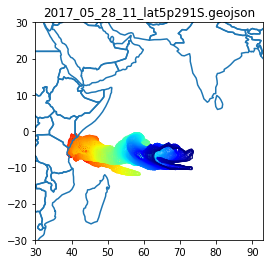

In [10]:
# Pick a clean one
case = eq7cases.iloc[4]; 
showme(case.filename)

In [11]:
# Get first and last times for xarray time slicing
lastt = datetime.strptime(case.lasttime,'%Y-%m-%d %H:%M:%S')
dog = datetime.strptime(case.duration,"%d days %H:%M:%S")
delta = timedelta(days=dog.day, hours=dog.hour)
firstt = lastt-delta

firstt, lastt

(datetime.datetime(2017, 5, 21, 7, 0), datetime.datetime(2017, 5, 28, 11, 0))

In [12]:
# MERRA: get oneself authenticated first 
URL = 'dods://goldsmr4.gesdisc.eosdis.nasa.gov/dods/M2I1NXASM'
#testURL = 'https://goldsmr5.gesdisc.eosdis.nasa.gov/dods/M2I3NPASM'
#testURL = 'https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2021/20210719/gfs.0p25.2021071900.f024.grib2'
ds = xr.open_dataset(URL).sel(time=slice(firstt,lastt), lat=slice(-25,25), lon=slice(30,100))
ds

/Users/brianmapes/opt/miniconda3/envs/geopy/lib/python3.10/site-packages/xarray/coding/times.py:144: SerializationWarning: Ambiguous reference date string: 1-1-1 00:00:0.0. The first value is assumed to be the year hence will be padded with zeros to remove the ambiguity (the padded reference date string is: 0001-1-1 00:00:0.0). To remove this message, remove the ambiguity by padding your reference date strings with zeros.
  warnings.warn(warning_msg, SerializationWarning)


<xarray.Dataset>
Dimensions:  (time: 171, lat: 101, lon: 113)
Coordinates:
  * time     (time) datetime64[ns] 2017-05-21T08:00:00.000003 ... 2017-05-28T...
  * lat      (lat) float64 -25.0 -24.5 -24.0 -23.5 -23.0 ... 23.5 24.0 24.5 25.0
  * lon      (lon) float64 30.0 30.62 31.25 31.88 ... 98.12 98.75 99.38 100.0
Data variables: (12/24)
    disph    (time, lat, lon) float32 ...
    ps       (time, lat, lon) float32 ...
    qv10m    (time, lat, lon) float32 ...
    qv2m     (time, lat, lon) float32 ...
    slp      (time, lat, lon) float32 ...
    t10m     (time, lat, lon) float32 ...
    ...       ...
    u10m     (time, lat, lon) float32 ...
    u2m      (time, lat, lon) float32 ...
    u50m     (time, lat, lon) float32 ...
    v10m     (time, lat, lon) float32 ...
    v2m      (time, lat, lon) float32 ...
    v50m     (time, lat, lon) float32 ...
Attributes:
    title:        MERRA-2 inst1_2d_asm_Nx: 2d,1-Hourly,Instantaneous,Single-L...
    Conventions:  COARDS\nGrADS
    dataType:     Grid
    history:      Thu Jan 19 02:15:29 GMT 2023 : imported by GrADS Data Serve...

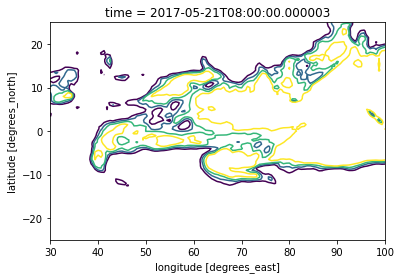

In [13]:
ds.tqv[0].squeeze().plot.contour(levels=[45,48,51,55])

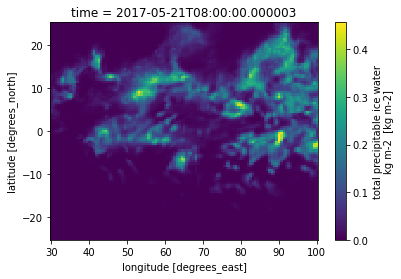

In [14]:
# ice water (deep convection indicator) 
ds.tqi[0].squeeze().plot.pcolormesh()

In [15]:
import hvplot.xarray  # https://hvplot.holoviz.org/ * is composition operator
# color palettes here https://docs.bokeh.org/en/latest/docs/reference/palettes.html
# vapor, and ice cloud mass

ds.tqv[0].hvplot(clim=(0, 80))* \
ds.tqv[0].hvplot.contour(levels=[55],cmap='BuGn')* \
ds.tqi[0].hvplot.contour(levels=[0.25],cmap='RdPu')

:Overlay
   .Image.I     :Image   [lon,lat]   (tqv)
   .Contours.I  :Contours   [lon,lat]   (tqv)
   .Contours.II :Contours   [lon,lat]   (tqi)

In [16]:
# Coastline, from geoviews, seems to kill the other layers 
# try * gf.coastline? doesn't seem to work... read docs to fix... 
import cartopy.crs as ccrs
import geoviews as gv 
import geoviews.feature as gf

ds.tqv[0].hvplot(clim=(0, 80), coastline=True ) * \
ds.tqv[0].hvplot.contour(levels=[55],cmap='BuGn')* \
ds.tqi[0].hvplot.contour(levels=[0.25],cmap='RdPu') 

:Overlay
   .Image.I     :Image   [lon,lat]   (tqv)
   .Coastline.I :Feature   [Longitude,Latitude]
   .Contours.I  :Contours   [lon,lat]   (tqv)
   .Contours.II :Contours   [lon,lat]   (tqi)

In [17]:
# Animation 

# from https://xarray-contrib.github.io/xarray-tutorial/scipy-tutorial/
#               04_plotting_and_visualization.html
# set constant colorbar limits

ds.tqv.hvplot(
    groupby="time",  # adds a widget for time
    clim=(0, 80),  # sets colormap limits
    widget_type="scrubber",
    widget_location="bottom",
)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=170, width=550)
        [2] HSpacer()

------------------
<a id='GFS'></a>

# GFS forecasts, by lead time 

[Back to Outline](#Outline)

In [18]:
import datetime
import xarray as xr 
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

In [19]:
# Verification time: 2017-05-27
vtime = datetime.datetime(2017,5,27)
URLyear = 'https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/' # <-- NOTE YYYY

# Loop over 6-hourly initializations 
# https://rda.ucar.edu/thredds/catalog/files/g/ds084.1/2021/20210719/catalog.html

first=True # set a flag for the loop to overwrite

In [20]:
for lead in range(7*24,6,-6): 
    
    init = vtime - datetime.timedelta(hours=lead)
    foldername = str(init.strftime('%Y%m%d'))
    filename = str(init.strftime('%Y%m%d%H'))+'.f'+str(lead).zfill(3)
    URL = URLyear + foldername+'/gfs.0p25.'+filename+'.grib2'
    print(lead,URL)
 
# Open URL as a dataset 
    ds = xr.open_dataset(URL)
    
# Subset to WEIO  
    weio = ds.sel(lat=slice(25,-25), lon=slice(30,100))

    tqv = weio.Precipitable_water_entire_atmosphere_single_layer 
    
    tqvs= tqv.drop_vars(['time','time1','time2'],errors='ignore').to_dataset()
    
    if first: 
        leadens = tqvs
        first = False
    else:
        leadens = xr.concat([leadens,tqvs],'reftime')
        
leadens
#leadensz.to_netcdf('/Users/brianmapes/Box/Henan_flood/Henan_leadtime_ens_z.nc')

168 https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/20170520/gfs.0p25.2017052000.f168.grib2
162 https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/20170520/gfs.0p25.2017052006.f162.grib2
156 https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/20170520/gfs.0p25.2017052012.f156.grib2
150 https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/20170520/gfs.0p25.2017052018.f150.grib2
144 https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/20170521/gfs.0p25.2017052100.f144.grib2
138 https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/20170521/gfs.0p25.2017052106.f138.grib2
132 https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/20170521/gfs.0p25.2017052112.f132.grib2
126 https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/20170521/gfs.0p25.2017052118.f126.grib2
120 https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/20170522/gfs.0p25.2017052200.f120.grib2
114 https://rda.ucar.edu/thredds/dodsC/files/g/ds084.1/2017/20170522/gfs.0p25.2017052206.f114.grib2


<xarray.Dataset>
Dimensions:                                            (lat: 201, lon: 281,
                                                        reftime: 27, time: 1,
                                                        time1: 1)
Coordinates:
  * lat                                                (lat) float32 25.0 ......
  * lon                                                (lon) float32 30.0 ......
  * reftime                                            (reftime) datetime64[ns] ...
Dimensions without coordinates: time, time1
Data variables:
    Precipitable_water_entire_atmosphere_single_layer  (reftime, time, lat, lon, time1) float32 ...

In [21]:
leadens.to_netcdf('/Users/brianmapes/Library/CloudStorage/Box-Box/Proposals_drafts/VaporLakes_proposal_pressrelease/LakeCaseStudy.GFSleads.PW.nc')

# Holoviews display: rain with leadtime slider

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
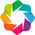

In [22]:
import geoviews as gv
import geoviews.feature as gf
import hvplot.xarray
gv.extension('bokeh', 'matplotlib')
# gv.help(gv.Contours) # learning about contour options 

leadens = xr.open_dataset('/Users/brianmapes/Library/CloudStorage/Box-Box/Proposals_drafts/VaporLakes_proposal_pressrelease/LakeCaseStudy.GFSleads.PW.nc')

# Prepare the display 
clipped = leadens.clip(max=50) # for display purposes 
gvds = gv.Dataset(clipped)
ensemble = gvds.to(gv.Image, ['lon', 'lat'], 
                   'Precipitable_water_entire_atmosphere_single_layer')

:HoloMap   [reftime]
   :Overlay
      .Image.I     :Image   [lon,lat]   (Precipitable_water_entire_atmosphere_single_layer)
      .Coastline.I :Feature   [Longitude,Latitude]
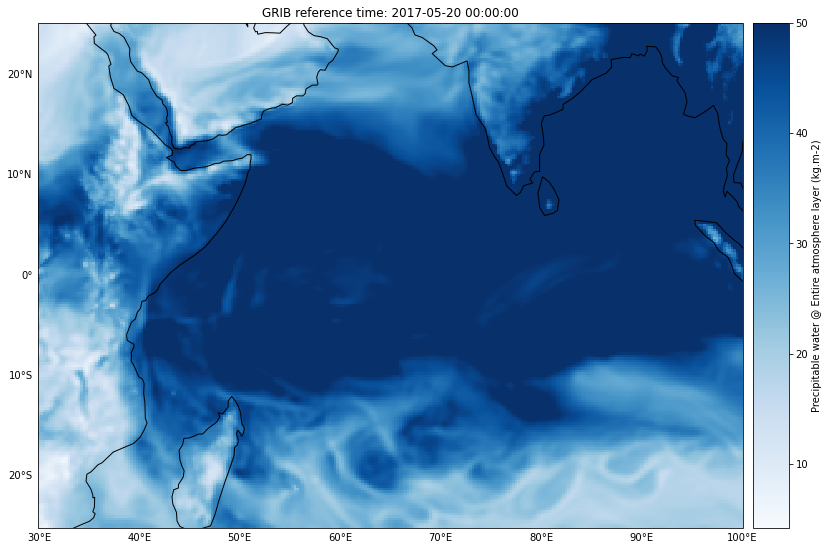
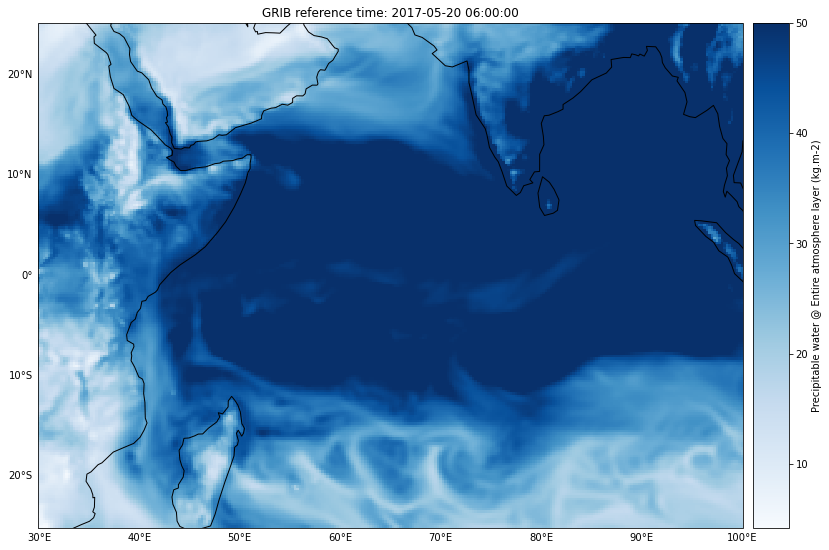
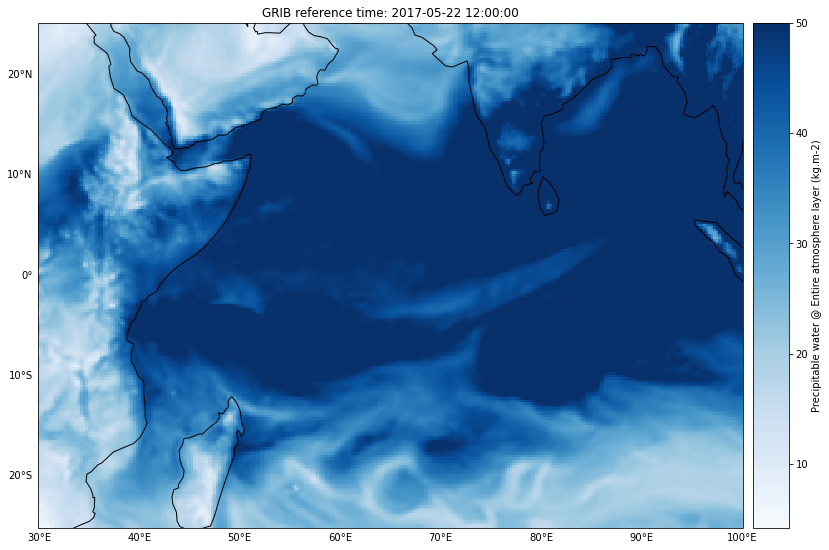
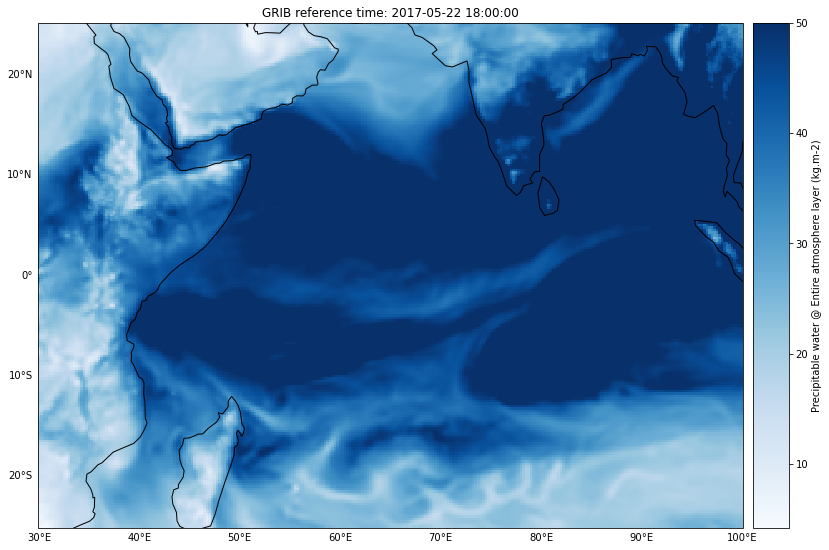
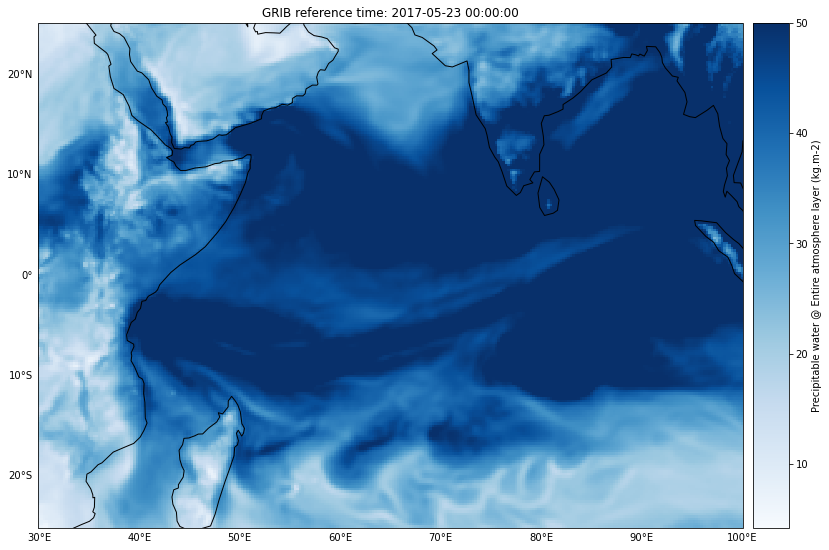
...
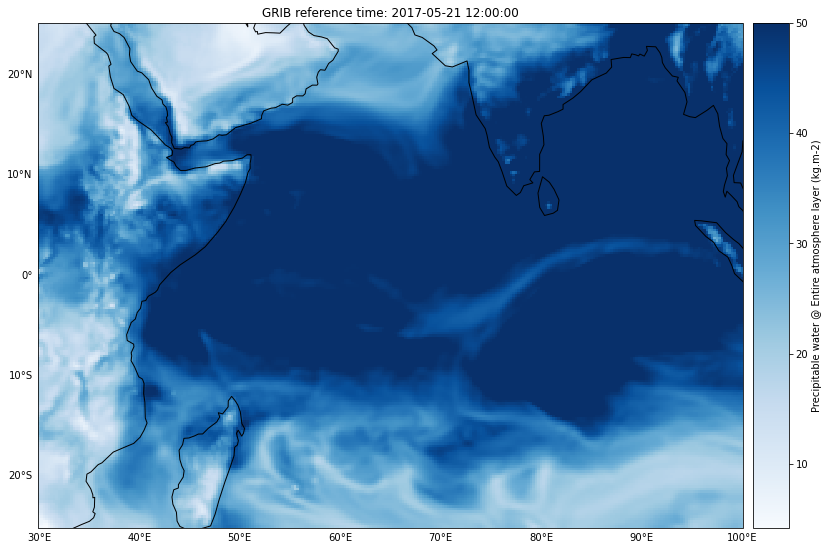
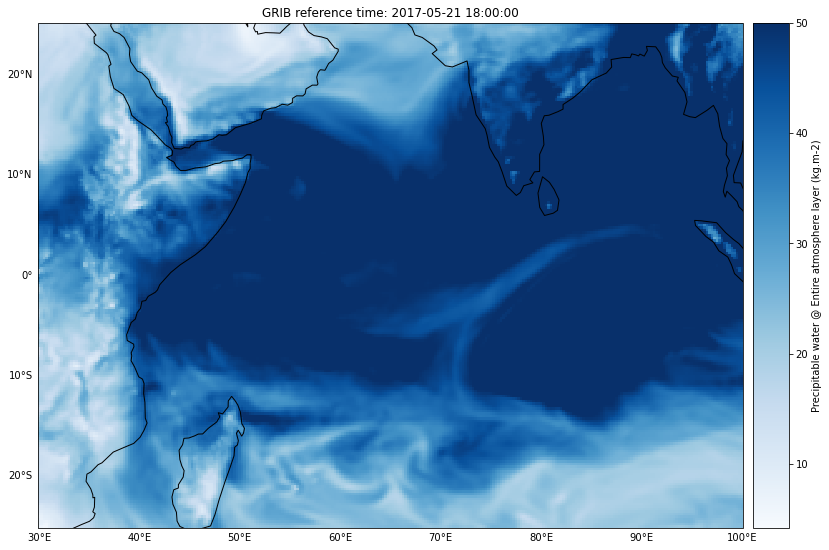
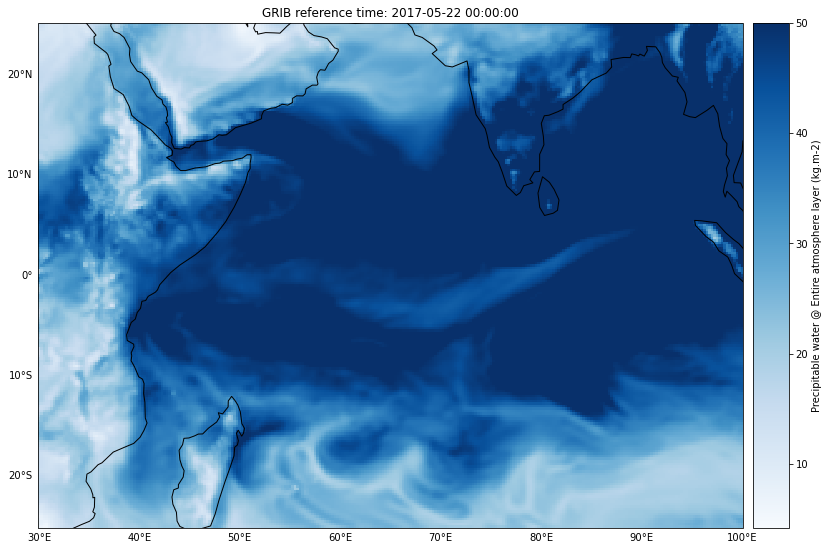
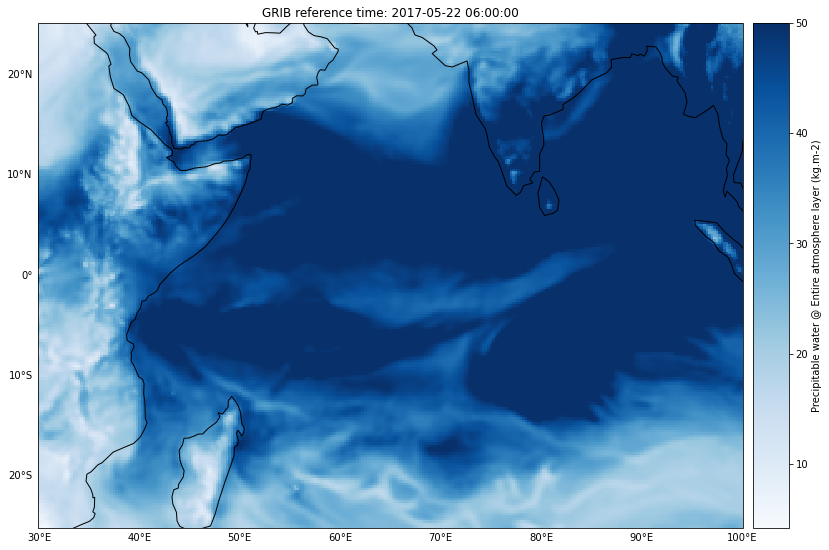
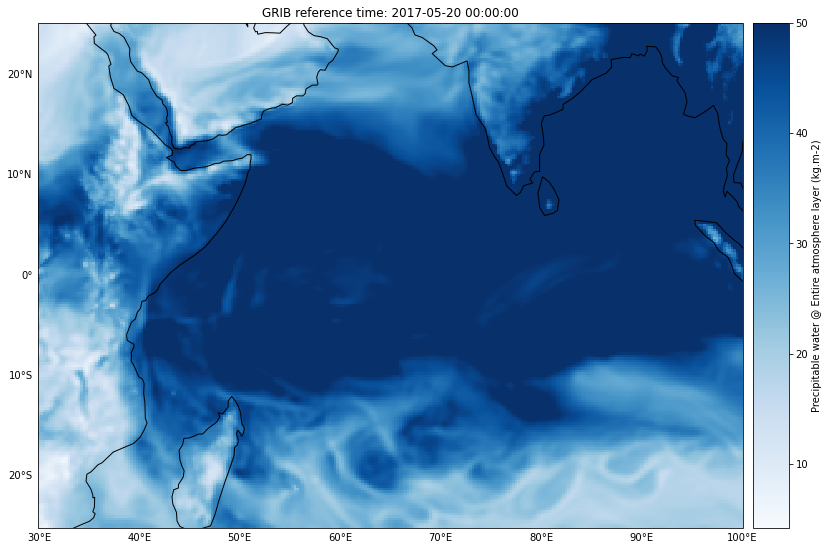

In [23]:
# Show it 
gv.output(ensemble.opts(cmap='Blues', colorbar=True, fig_size=350, 
                        backend='matplotlib') * gf.coastline(),\
                        backend='matplotlib', widget_location='bottom')

In [ ]:
horncases = dfu1[ (dfu1.coastlat) > 10 ] # about a dozen
horncases

In [ ]:
for file in horncases.filename: 
    gdf = showme(file)

In [ ]:
SHcases = dfu1[ dfu1.coastlat < -10 ] #  of them exceeding 1 day 
SH7cases = SHcases[ SHcases.dur_days > 6 ] # 31 of them  
len(SH7cases)

In [ ]:
for file in SH7cases.filename: 
    gdf = showme(file)

In [ ]:
biggies = dfu.sort_values('areatime', ascending=False)[0:10]
biggies

In [ ]:
for file in biggies.filename: 
    gdf = showme(file)

In [ ]:
longduration = dfu.sort_values('duration', ascending=False)[0:10]
longduration

In [ ]:
for file in longduration.filename: 
    gdf = showme(file)